In [92]:
model = DQN.load('/content/drive/MyDrive/reinforce_learning/dqn_training/model_chkpts')

In [69]:
"""!pip install setuptools
!pip install -v cmake gymnasium 'gym[toy_text]' gym[atari]
!pip install gym[accept-rom-license]
!pip install atari-p
!pip install stable-baselines3[extra] pyvirtualdisplay gym[atari] pyglet"""

"!pip install setuptools\n!pip install -v cmake gymnasium 'gym[toy_text]' gym[atari]\n!pip install gym[accept-rom-license]\n!pip install atari-p\n!pip install stable-baselines3[extra] pyvirtualdisplay gym[atari] pyglet"

In [70]:
#import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import VecFrameStack
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.env_util import make_atari_env
from stable_baselines3.common.callbacks import EvalCallback

In [71]:
import matplotlib.pyplot as plt
import gymnasium as gym
import numpy as np
from gym.envs.toy_text.frozen_lake import generate_random_map
from tqdm.notebook import trange
from IPython.display import clear_output, display, Markdown, HTML
from collections import defaultdict
from matplotlib import pyplot as plt, animation
from IPython import display
from stable_baselines3 import DQN

In [72]:
def create_anim(frames, dpi=150, fps=60, scale=2):
    plt.figure(figsize=(frames[0].shape[1] * scale / dpi, frames[0].shape[0] * scale / dpi), dpi=dpi)
    patch = plt.imshow(frames[0])
    def setup():
        plt.axis('off')
    def animate(i):
        patch.set_data(frames[i])
    anim = animation.FuncAnimation(plt.gcf(), animate, init_func=setup, frames=len(frames), interval=fps)
    return anim

def display_anim(frames, dpi=72, fps=60):
    anim = create_anim(frames, dpi, fps)
    return anim.to_jshtml()

def save_anim(frames, filename, dpi=150, fps=60):
    anim = create_anim(frames, dpi, fps)
    anim.save(filename)

In [73]:
BANK_HEIST = 'ALE/BankHeist-v5'
env = gym.make(BANK_HEIST, render_mode="rgb_array",full_action_space=True)

/usr/local/lib/python3.10/dist-packages/gymnasium/utils/passive_env_checker.py:335: UserWarning: WARN: No render fps was declared in the environment (env.metadata['render_fps'] is None or not defined), rendering may occur at inconsistent fps.
  logger.warn(


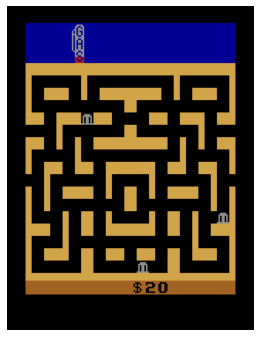

In [74]:
env.reset()
done = False
frames = []

while not done:
    frames.append(env.render())
    action = env.action_space.sample()
    n_state, reward, done, truncated, info = env.step(action)

display.HTML(display_anim(frames))

In [75]:
env = make_atari_env(BANK_HEIST, n_envs=4, seed=0) #make_atari_env helps in creating wrapped Atari env
env = VecFrameStack(env, n_stack=4)  #VecFrameStack allows to stack env together

In [90]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [77]:
log_path = '/content/drive/MyDrive/reinforce_learning/dqn_training/logs'
model_path = '/content/drive/MyDrive/reinforce_learning/dqn_training/model_chkpts'

### DQN


In [78]:
model = DQN("MlpPolicy",
            env,
            learning_rate=0.0001,
            batch_size=32,
            gamma=0.50,
            verbose=1,
            tensorboard_log=log_path)

Using cuda device
Wrapping the env in a VecTransposeImage.


/usr/local/lib/python3.10/dist-packages/stable_baselines3/common/buffers.py:241: UserWarning: This system does not have apparently enough memory to store the complete replay buffer 56.46GB > 7.46GB
  warnings.warn(


In [79]:
def evaluate_bank_heist(env, model):
    frames = []
    episodes = 10

    steps = 0
    for episode in range(1, episodes+1):
        obs = env.reset()
        done = np.array([False] * 4)
        score = 0

        while not done.any():
            frames.append(env.render())
            action , _ = model.predict(obs) #action = env.action_space.sample()
            obs, reward, done, info = env.step(action) #n_state, reward, done, info = env.step(action)
            score += reward
            steps += 1
        print(f"Episode: {episode} | Score: {score}")

    print(f'\nMean game time: {steps / episodes:0.1f} frames')
    return frames

In [80]:
evaluate_bank_heist(env, model);

/usr/local/lib/python3.10/dist-packages/gymnasium/utils/passive_env_checker.py:335: UserWarning: WARN: No render fps was declared in the environment (env.metadata['render_fps'] is None or not defined), rendering may occur at inconsistent fps.
  logger.warn(


Episode: 1 | Score: [0. 0. 0. 0.]
Episode: 2 | Score: [0. 0. 0. 0.]
Episode: 3 | Score: [0. 0. 0. 0.]
Episode: 4 | Score: [0. 0. 0. 0.]
Episode: 5 | Score: [0. 0. 0. 0.]
Episode: 6 | Score: [0. 0. 0. 0.]
Episode: 7 | Score: [0. 0. 0. 0.]
Episode: 8 | Score: [0. 0. 0. 0.]
Episode: 9 | Score: [0. 0. 0. 0.]
Episode: 10 | Score: [0. 0. 0. 0.]

Mean game time: 33.3 frames


In [81]:
model.learn(total_timesteps=10000)

Logging to /content/drive/MyDrive/reinforce_learning/dqn_training/logs/DQN_7
----------------------------------
| rollout/            |          |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4        |
|    fps              | 312      |
|    time_elapsed     | 0        |
|    total_timesteps  | 80       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 924      |
|    ep_rew_mean      | 10       |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 8        |
|    fps              | 333      |
|    time_elapsed     | 0        |
|    total_timesteps  | 292      |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0138   |
|    n_updates        | 12       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_m

In [82]:
model.save(model_path)

In [83]:
ev = evaluate_policy(model, env, n_eval_episodes=50, render=False)
env.close()
ev

(17.4, 9.123595782365635)

In [84]:
frames = evaluate_bank_heist(env, model)

Episode: 1 | Score: [0. 0. 0. 0.]
Episode: 2 | Score: [0. 0. 0. 0.]
Episode: 3 | Score: [0. 0. 0. 2.]
Episode: 4 | Score: [0. 0. 0. 0.]
Episode: 5 | Score: [0. 0. 0. 0.]
Episode: 6 | Score: [0. 0. 0. 1.]
Episode: 7 | Score: [0. 0. 0. 0.]
Episode: 8 | Score: [0. 0. 0. 0.]
Episode: 9 | Score: [0. 0. 0. 0.]
Episode: 10 | Score: [0. 0. 0. 0.]

Mean game time: 12.9 frames


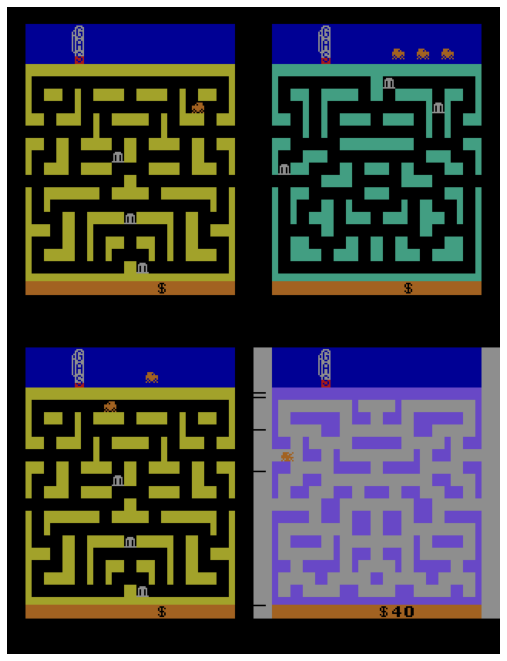

In [85]:
display.HTML(display_anim(frames))